In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import db
import pam
import utils as ut
import features as ft
import dtw
import clustering_evaluation as ce
import seq2seq as s2s
from scipy.spatial.distance import euclidean,cityblock
import time

from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
import matplotlib.cm as cm
from sklearn.decomposition import PCA

In [2]:
DATA_PATH = "data/grl/"
DATA_BASE = DATA_PATH + "grl.sqlite"
SAVE_PATH = DATA_PATH + "generated_data/"
FRAME_PATH = DATA_PATH + "grl.png"
VIDEO_PATH = DATA_PATH + "grl.MOV"
HOMOGRAPHY = DATA_PATH + "homography.txt"
DISTANCES = SAVE_PATH + "distances/cityblock_50.txt"

In [3]:
trajectories_po,ids_po,nb_objects = db.get_trajectories_by_object(DATA_BASE)
nb_trajectories_per_object_unsup = 1
trajectories_po_unsup,ids_po_unsup = db.filter_trajectories(nb_trajectories_per_object_unsup, trajectories_po, ids_po)

#total number of selected trajectories
nb_trajectories_unsup = nb_trajectories_per_object_unsup * nb_objects

# list of every selected trajectory, 
trajectories_unsup = [t for o in trajectories_po_unsup for t in o]
# ids of every selected trajectory
ids_unsup = [i for o in ids_po_unsup for i in o]
# trajectories in pixel space, for displaying purposes only
pixel_trajectories_unsup = np.array([ut.to_pixel(t,HOMOGRAPHY) for t in trajectories_unsup])

In [4]:
#trajectories = discretized_trajectories_unsup
trajectories = np.array(trajectories_unsup)
pixel_trajectories = pixel_trajectories_unsup

In [5]:
start = time.time()
features = [ft.compute_features(trajectory) for trajectory in trajectories]
features,_ = ft.standardize_features(features)
features = pd.DataFrame(features)
print("execution duration: " + str(time.time()-start))

execution duration: 82.0971050262


In [6]:
pca = PCA(n_components=0.999)
features = pca.fit_transform(features)
pca.n_components_

32

In [8]:
max_clusters = 30
silhouette, _ = ce.u_clustering_eval(max_clusters,KMeans(),features)
np.argmax(silhouette)+2,np.max(silhouette)

(12, 0.4097354881319102)

In [9]:
ce.get_k_local_optima(np.array(silhouette),3)

[12, 17, 14]

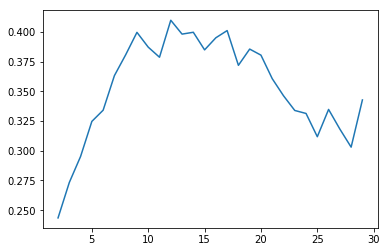

In [10]:
plt.plot(np.arange(2,max_clusters,1),silhouette)

In [23]:
nb_clusters = 21
clusters = KMeans(n_clusters=nb_clusters).fit_predict(features)

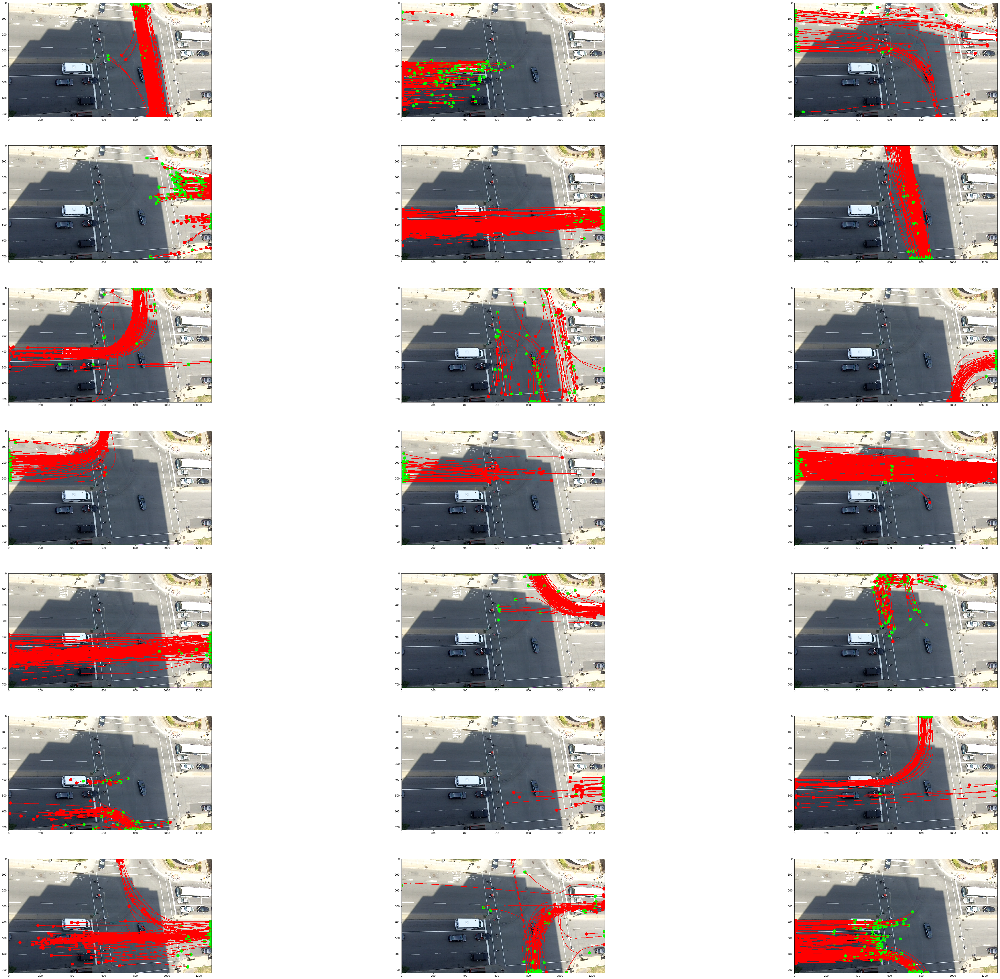

In [24]:
ut.display_clusters_oat_i(clusters,FRAME_PATH,pixel_trajectories)

In [25]:
clusters_to_keep = [0,2,4,5,6,8,9,11,12,13,17,19,20]

In [26]:
ids_k = [i for i,c in enumerate(clusters) if c in clusters_to_keep]

# first filter

In [27]:
start = time.time()
features_k = [ft.compute_features(trajectory) for trajectory in trajectories[ids_k]]
features_k,_ = ft.standardize_features(features_k)
features_k = pd.DataFrame(features_k)
print("execution duration: " + str(time.time()-start))

execution duration: 56.931910038


In [28]:
pca = PCA(n_components=0.999)
features_pca_unsup = pca.fit_transform(features_k)
pca.n_components_

32

In [29]:
max_clusters = 30
silhouette, _ = ce.u_clustering_eval(max_clusters,KMeans(),features_k)
np.argmax(silhouette)+2,np.max(silhouette)

(10, 0.5142359213934152)

In [30]:
ce.get_k_local_optima(np.array(silhouette),3)

[10, 12, 19]

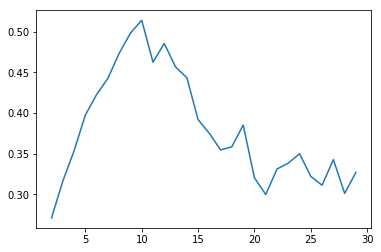

In [31]:
plt.plot(np.arange(2,max_clusters,1),silhouette)

In [34]:
nb_clusters = 19
clusters = KMeans(n_clusters=nb_clusters).fit_predict(features_k)

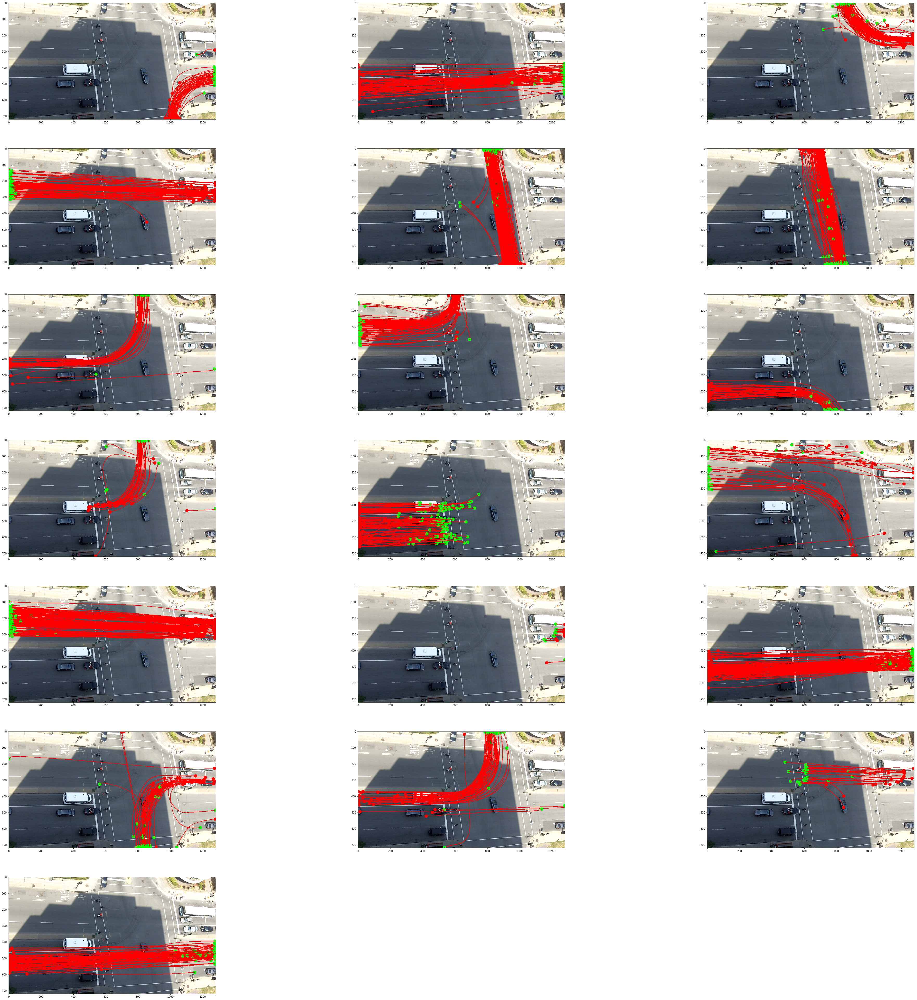

In [35]:
ut.display_clusters_oat_i(clusters,FRAME_PATH,pixel_trajectories[ids_k])

In [36]:
clusters_to_keep1 = [0,1,2,3,4,5,6,7,8,12,14,15,16,18]

In [37]:
ids_k1 = [i for i,c in enumerate(clusters) if c in clusters_to_keep1]

In [38]:
ids_k = np.array(ids_k)

In [39]:
ids = ids_k[ids_k1]

In [40]:
np.savetxt(SAVE_PATH + "ids.txt",ids)

## recluster

In [20]:
def recluster(clusters,discretized_features_unsup,index, nb_c = -1):
    ids_perse = [[j for j,c in enumerate(clusters) if c == i] for i in range(nb_clusters) ]
    trajectories_c = trajectories[ids_perse[index]]
    pixel_trajectories_c = pixel_trajectories[ids_perse[index]]
    fc= discretized_features_unsup.iloc[ids_perse[index]]
    fc,_ = ft.standardize_features(fc)
    pca = PCA(n_components=0.99)
    fc = pca.fit_transform(fc)
    
    if nb_c < 0:
        max_clusters = 10
        silhouette, _ = ce.u_clustering_eval(max_clusters,KMeans(),fc)
        print(np.argmax(silhouette)+2,np.max(silhouette))
        plt.plot(np.arange(2,max_clusters,1),silhouette)
        nb_c = np.argmax(silhouette)+2
    
    clusters_c = KMeans(n_clusters=nb_c).fit_predict(fc)
    return clusters_c,pixel_trajectories_c